Parkinson's is a neurodegenarative progressive disorder disease. It affects the nervous system and the part of the body controlled by it. It appears in the part of the brain called substantia nigra. Normally these brain cells produce dopamine and these dopamine operates in a delicate balance with other neurotransmitters to help cordinate the millions of nerve and muscle cell involved in the movement. When these nerve cells die or become impaired, they lose the ability to produce the dopamine. When 60-80% of these cells are lost then enough dopamine are not produced and Parkinson's motor symptoms appear. Without enough dopamine, this balance is disrupted resulting tremor, rigidity, slowness of movement and impaired balance. So Parkinson's disease is caused by the disruption of the brain cells that produce the dopamine which allows the brain to communicate each other and control the fluency of the movement. It is thought that the disease begins many years before the motor symptoms appears and therefore, researchers are looking for ways to recognize the non-motor symptoms that appear early in the disease as early as possible, thereby halting the progression of the disease. A person suffering from the Parkinson's can have following symptoms:


*Tremor*

*Slowed movement*

*Rigid muscle*

*Impaired posture*

*Loss of automatic movement*

*Speech change*

*Writing change*

*Impaired posture*

Also, Parkinson's disease can have other symptoms that include:

*Depression*

*Anxiety*

*Sleeping and memory-related issues*

*Loss of sense of smell along with balance problems*

The symptoms of Parkinson's disease can be different from patient to patient. Early sign of the disease can be mild and can go unnoticed. Symptoms often begin on one side of your body and usually remain worse on that side. Sometimes it is difficult to detect whether there is Parkinson's disease present in the patient's body. Parkinson's disease if detected in the early stage will be curable, and will be time and cost effective, but there is no effective treatment in the advanced stage.

The dataset used in this project is from UCI machine learning data bank. The dataset has 24 columns, thus we need to reduce the dimension before we train the data. The target or independent variable is "status" with binary values of 0 and 1. Status values for healthy person and PD person are 0 and 1 respectively.m The goal of this project is to develope the best machine learning model to predict the Parkinson's disease so that we can treat the patient in the timely manner. The following are the columns in the dataset.

**name**: This column represents the name of the patient. It serves as an identifier and is not directly related to the voice measurements.

**mdvp:fo(hz)**: This column represents the fundamental frequency of the voice measured in hertz (Hz). It indicates the rate at which the vocal folds vibrate, which is a key parameter for voice production.

**mdvp:fhi(hz)**: This column represents the highest frequency component in the voice measured in hertz (Hz). It provides information about the upper limit of the vocal range.

**mdvp:flo(hz)**: This column represents the lowest frequency component in the voice measured in hertz (Hz). It provides information about the lower limit of the vocal range.

**mdvp:jitter(%)**: This column represents the percentage of local frequency variation in the voice signal. It reflects the irregularity of vocal fold vibrations.

**mdvp:jitter(abs)**: This column represents the absolute value of the jitter measurement. It provides a quantification of the absolute frequency variation in the voice signal.

**mdvp:rap**: This column represents the relative amplitude perturbation in the voice signal. It measures the difference between consecutive peak amplitudes.

**mdvp:ppq**: This column represents the five-point period perturbation quotient. It measures the variations in the voice signal's cycle lengths.

**jitter:ddp**: This column represents the average absolute difference of differences between consecutive periods. It provides a measure of irregularities in the voice signal's cycle lengths.

**mdvp:shimmer**: This column represents the variation in amplitude of the voice signal. It reflects the presence of fluctuations or shimmer in the voice.

**mdvp:shimmer(db)**: This column represents the shimmer measurement in decibels (dB). It provides a quantification of the amplitude variation in the voice signal.

**shimmer:apq3**: This column represents the amplitude perturbation quotient for the first three harmonics. It measures the irregularities in the amplitude of specific frequency components.

**shimmer:apq5**: This column represents the amplitude perturbation quotient for the first five harmonics. It provides a measure of the irregularities in the amplitude of specific frequency components.

**mdvp:apq**: This column represents the amplitude perturbation quotient, which is the average absolute difference between consecutive amplitude periods. It quantifies the variations in the amplitude of the voice signal.

**shimmer:dda**: This column represents the average absolute differences of adjacent differences between consecutive amplitude periods. It provides a measure of the presence of shimmer in the voice signal.

**nhr**: This column represents the ratio of noise to harmonic components in the voice signal. It indicates the level of background noise in the voice.

**hnr**: This column represents the ratio of the energy in the harmonics to the energy in the noise. It provides an estimate of the clarity of the voice signal.

**status**: This column represents the binary target variable indicating the presence (1) or absence (0) of Parkinson's disease in the patient.

**rpde**: This column represents the nonlinear dynamical complexity measure of the voice signal. It quantifies the degree of determinism and predictability in the voice.

**dfa**: This column represents the detrended fluctuation analysis measure of the voice signal. It provides information about the presence of long-term correlations in the voice signal.

**spread1**: This column represents a nonlinear measure of the fundamental frequency variation. It quantifies the nonlinear dynamic behavior of the voice.

**spread2**: This column represents a nonlinear measure of the amplitude variation in the voice signal. It provides additional information about the nonlinear dynamics of the voice.

**d2**: This column represents the correlation dimension of the voice signal. It quantifies the complexity and structure in the voice signal.

**ppe**: This column represents the pitch period entropy of the voice signal. It provides information about the unpredictability of pitch periods.

**Citation - 'Exploiting Nonlinear Recurrence and Fractal Scaling Properties for Voice Disorder Detection', Little MA, McSharry PE, Roberts SJ, Costello DAE, Moroz IM. BioMedical Engineering OnLine 2007, 6:23 (26 June 2007)**

In [28]:
#pip install pandas-profiling

In [72]:
#import sys
#!{sys.executable} -m pip install -U ydata-profiling[notebook]
#!jupyter nbextension enable --py widgetsnbextension

In [71]:
import numpy as np
import matplotlib as plt
import pandas as pd
import seaborn as sns
from IPython.display import display
from pathlib import Path
from ipywidgets import widgets
#from ydata_profiling import ProfileReport
#from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [44]:
data = pd.read_csv('../data/parkinsons.data')

In [45]:
data

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


In [46]:
data.shape

(195, 24)

In [47]:
data.isna().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

In [48]:
data.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [49]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [50]:
data.columns = data.columns.str.lower()

In [52]:
data.columns

Index(['name', 'mdvp:fo(hz)', 'mdvp:fhi(hz)', 'mdvp:flo(hz)', 'mdvp:jitter(%)',
       'mdvp:jitter(abs)', 'mdvp:rap', 'mdvp:ppq', 'jitter:ddp',
       'mdvp:shimmer', 'mdvp:shimmer(db)', 'shimmer:apq3', 'shimmer:apq5',
       'mdvp:apq', 'shimmer:dda', 'nhr', 'hnr', 'status', 'rpde', 'dfa',
       'spread1', 'spread2', 'd2', 'ppe'],
      dtype='object')

In [51]:
data

,name,mdvp:fo(hz),mdvp:fhi(hz),mdvp:flo(hz),mdvp:jitter(%),mdvp:jitter(abs),mdvp:rap,mdvp:ppq,jitter:ddp,mdvp:shimmer,...,shimmer:dda,nhr,hnr,status,rpde,dfa,spread1,spread2,d2,ppe
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


In [26]:
#profile = ProfileReport(df)

In [32]:
#profile.to_widgets()

In [55]:
df = data.copy()

In [56]:
df

,name,mdvp:fo(hz),mdvp:fhi(hz),mdvp:flo(hz),mdvp:jitter(%),mdvp:jitter(abs),mdvp:rap,mdvp:ppq,jitter:ddp,mdvp:shimmer,...,shimmer:dda,nhr,hnr,status,rpde,dfa,spread1,spread2,d2,ppe
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


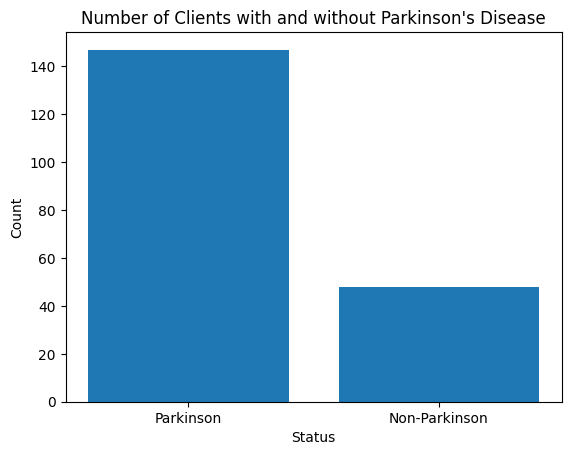

In [88]:
# Count the number of clients in each category
parkinson_count = df[df['status'] == 1].shape[0]
non_parkinson_count = df[df['status'] == 0].shape[0]

# Create a bar plot
plt.bar(['Parkinson', 'Non-Parkinson'], [parkinson_count, non_parkinson_count])
plt.xlabel('Status')
plt.ylabel('Count')
plt.title('Number of Clients with and without Parkinson\'s Disease')
plt.show()


 This plot shows the counts of each category in the 'status' column. It provides an overview of the distribution of the categorical variable.

C:\Users\Admin\AppData\Local\Temp\ipykernel_15552\4125945000.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


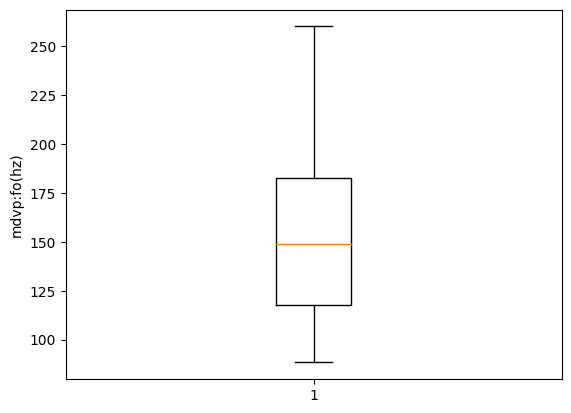

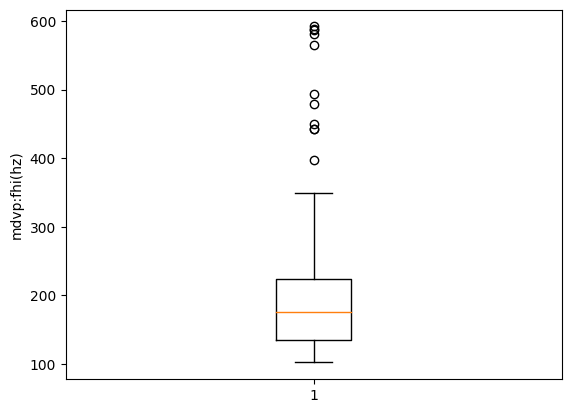

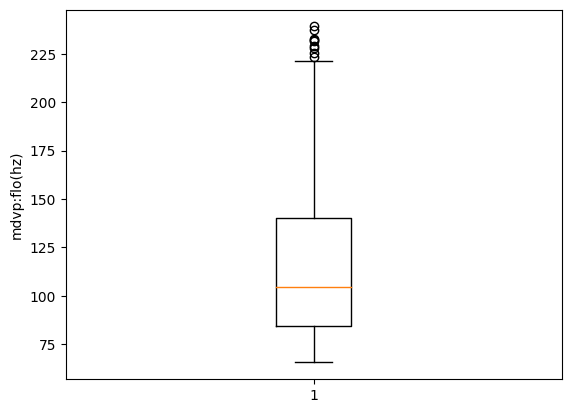

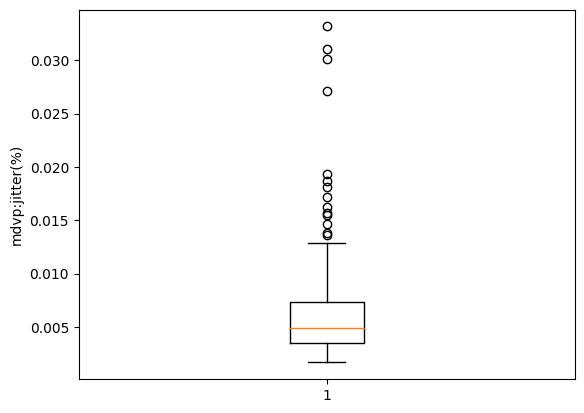

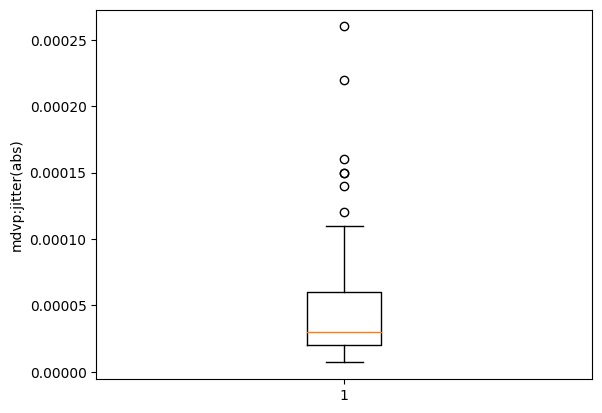

...

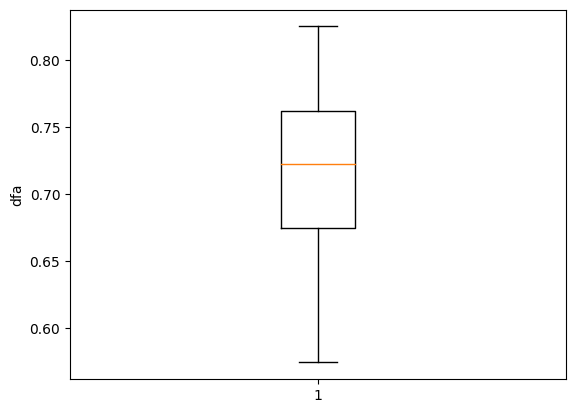

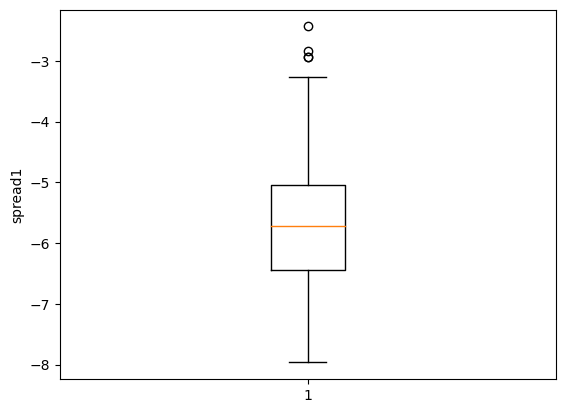

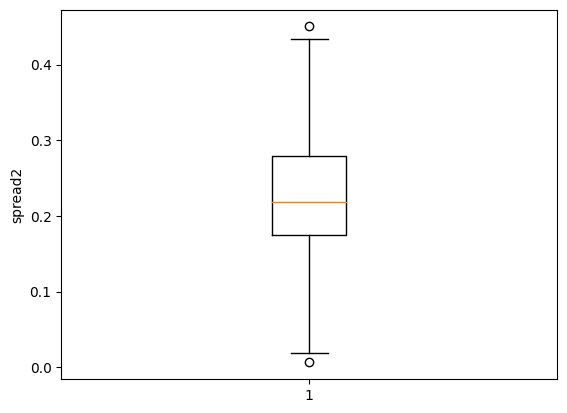

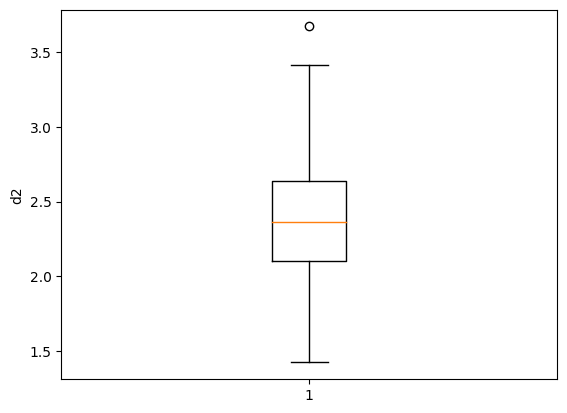

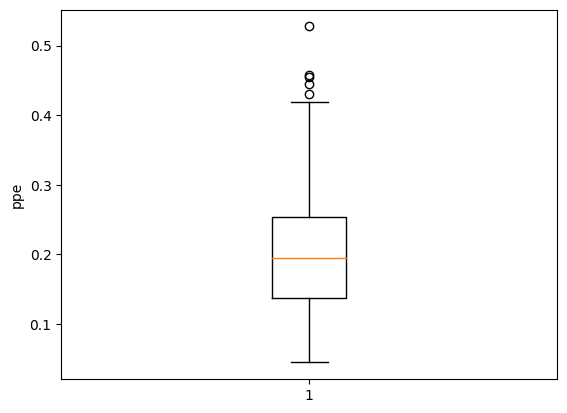

In [64]:
for i in df.columns[1:]:
    fig, ax = plt.subplots()
    ax.boxplot(df[i])
    plt.ylabel(i)



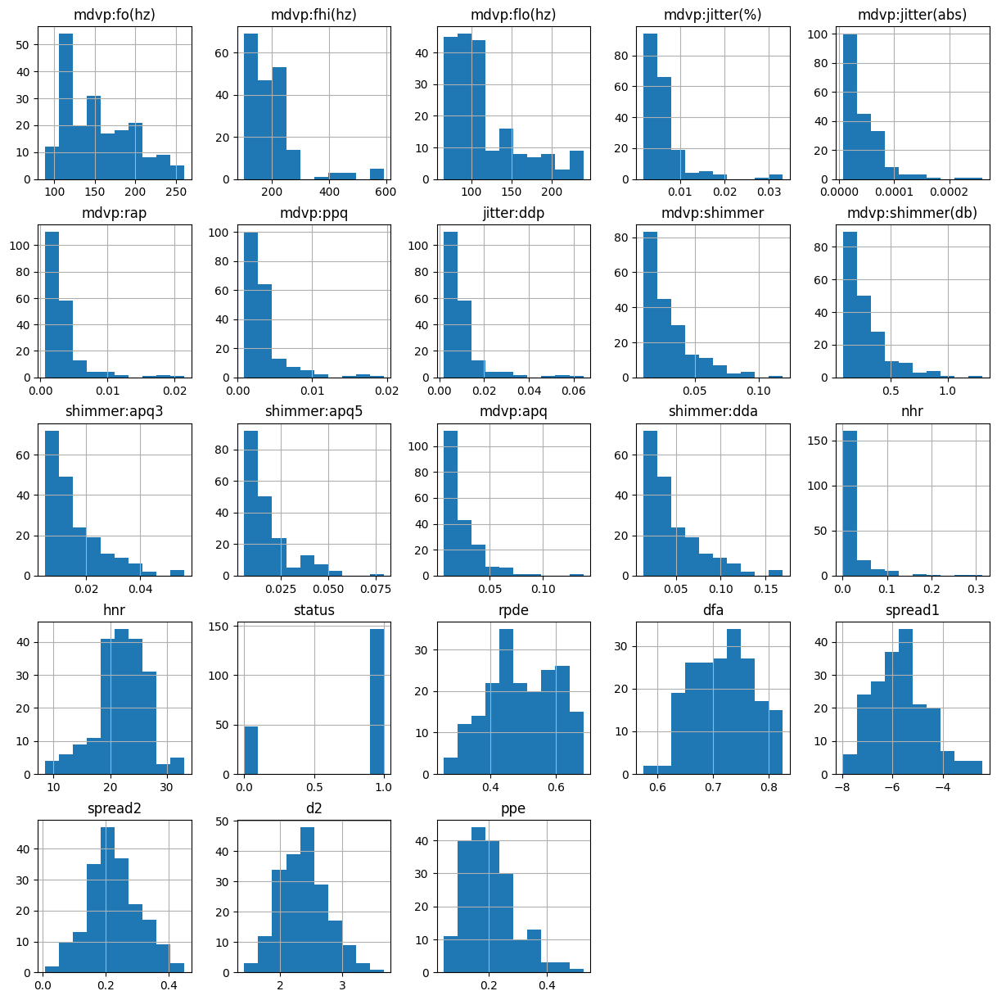

In [65]:
df.hist(figsize=(15,15));

This set of histograms shows the distribution of each numerical variable individually. It helps understand the shape and spread of the data for each variable.some columns are normally distributed and most of the attributes are right skewed

In [73]:
df['status'].value_counts()

status
1    147
0     48
Name: count, dtype: int64

There are 48 healthy patients and 147 parkinson disease affected patients

In [74]:
df.columns

Index(['name', 'mdvp:fo(hz)', 'mdvp:fhi(hz)', 'mdvp:flo(hz)', 'mdvp:jitter(%)',
       'mdvp:jitter(abs)', 'mdvp:rap', 'mdvp:ppq', 'jitter:ddp',
       'mdvp:shimmer', 'mdvp:shimmer(db)', 'shimmer:apq3', 'shimmer:apq5',
       'mdvp:apq', 'shimmer:dda', 'nhr', 'hnr', 'status', 'rpde', 'dfa',
       'spread1', 'spread2', 'd2', 'ppe'],
      dtype='object')

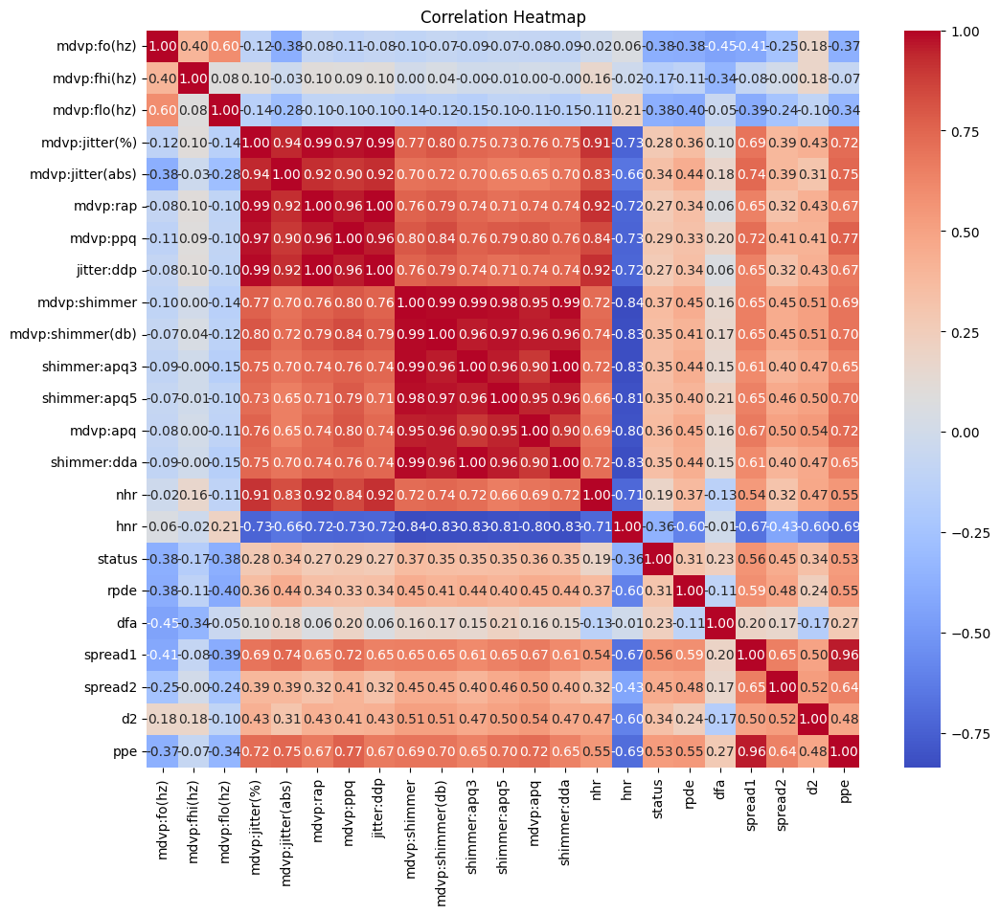

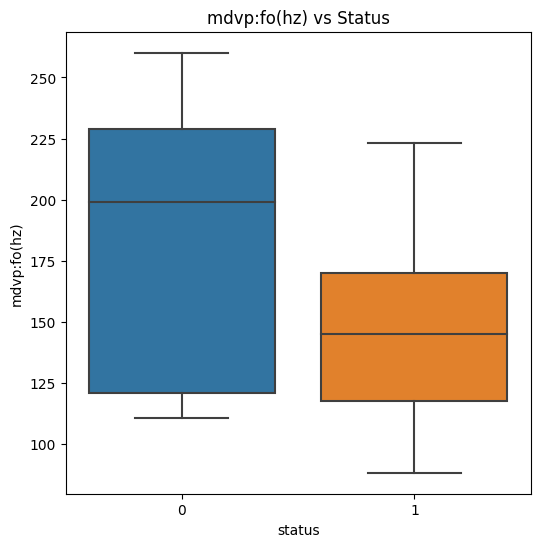

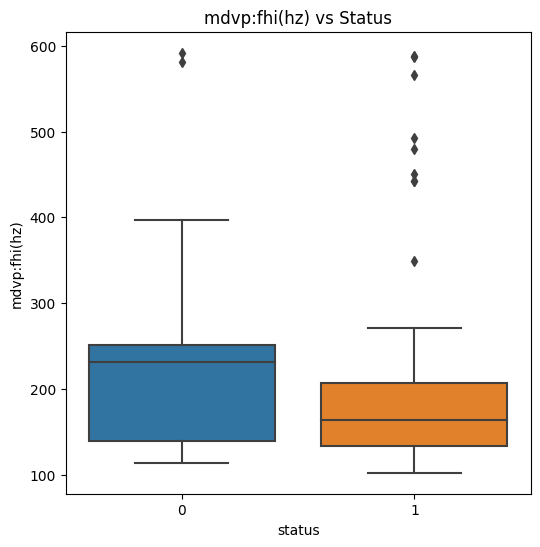

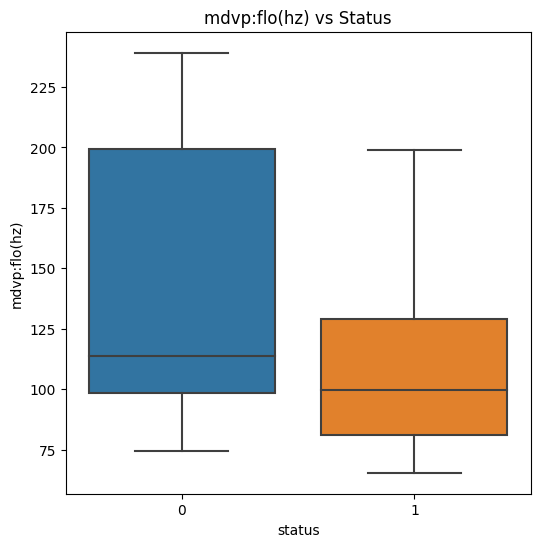

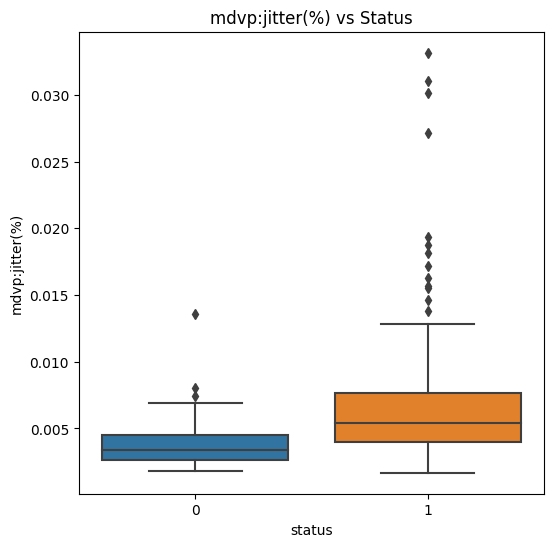

...

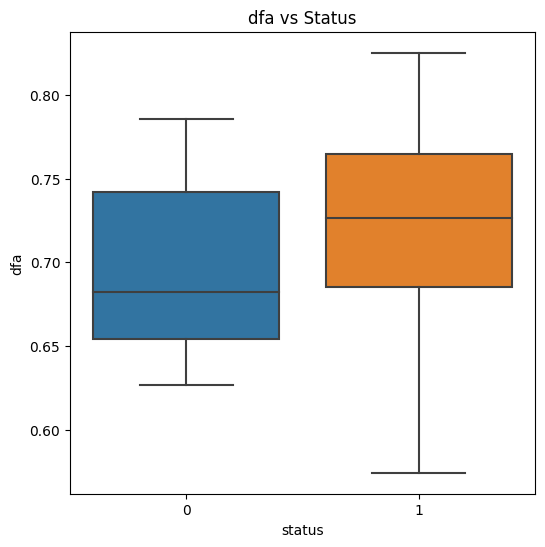

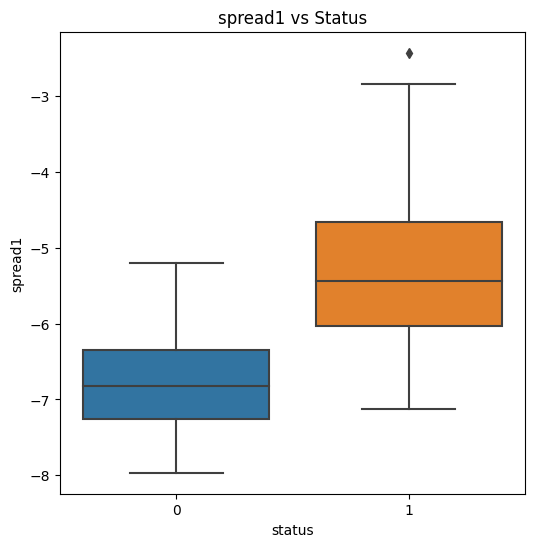

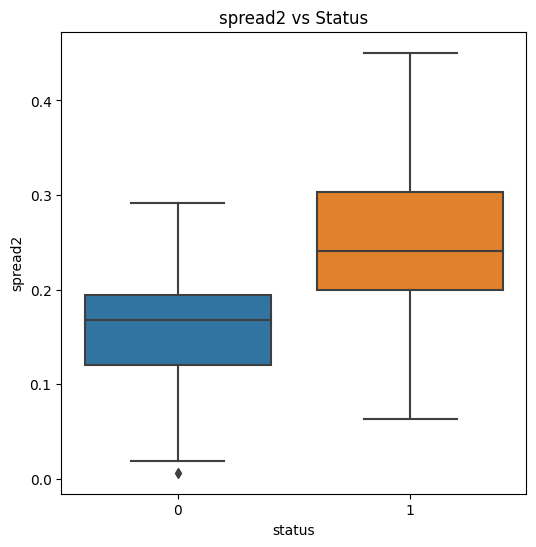

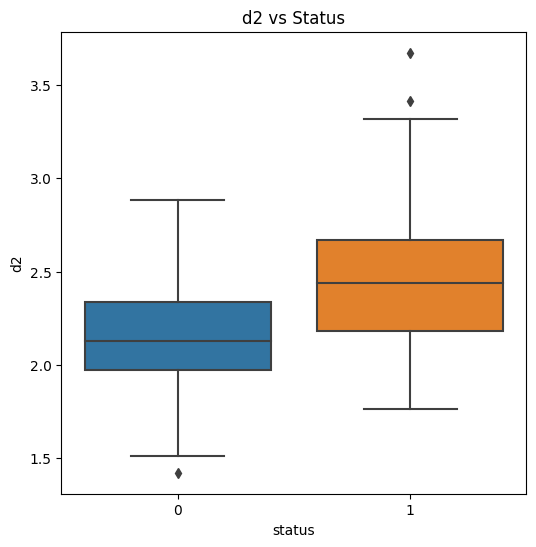

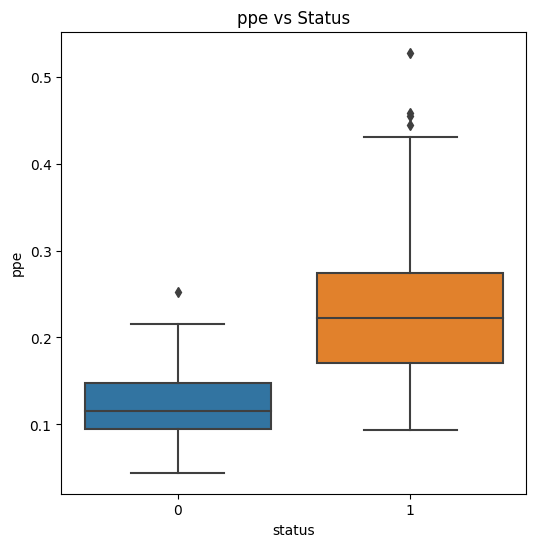

In [82]:
# Selecting the columns of interest
columns_of_interest = [ 'mdvp:fo(hz)', 'mdvp:fhi(hz)', 'mdvp:flo(hz)', 'mdvp:jitter(%)',
                       'mdvp:jitter(abs)', 'mdvp:rap', 'mdvp:ppq', 'jitter:ddp',
                       'mdvp:shimmer', 'mdvp:shimmer(db)', 'shimmer:apq3', 'shimmer:apq5',
                       'mdvp:apq', 'shimmer:dda', 'nhr', 'hnr', 'status', 'rpde', 'dfa',
                       'spread1', 'spread2', 'd2', 'ppe']

# Creating a subset DataFrame with the selected columns
subset_df = df[columns_of_interest]

# Calculate the correlation matrix
corr_matrix = subset_df.corr()

# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

# Plotting the correlation between 'status' and each column
for column in columns_of_interest:
    if column != 'status':
        plt.figure(figsize=(6, 6))
        sns.boxplot(x='status', y=column, data=subset_df)
        plt.title(f"{column} vs Status")
        plt.show()


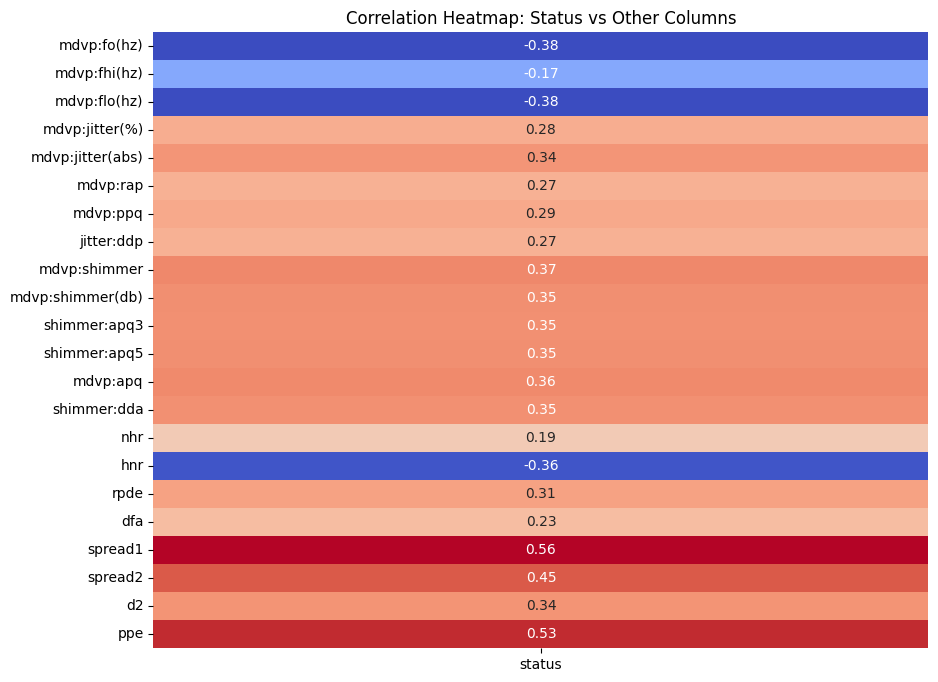

In [80]:
# Selecting the columns of interest
columns_of_interest = ['mdvp:fo(hz)', 'mdvp:fhi(hz)', 'mdvp:flo(hz)', 'mdvp:jitter(%)',
                       'mdvp:jitter(abs)', 'mdvp:rap', 'mdvp:ppq', 'jitter:ddp',
                       'mdvp:shimmer', 'mdvp:shimmer(db)', 'shimmer:apq3', 'shimmer:apq5',
                       'mdvp:apq', 'shimmer:dda', 'nhr', 'hnr', 'status', 'rpde', 'dfa',
                       'spread1', 'spread2', 'd2', 'ppe']

# Creating a subset DataFrame with the selected columns
subset_df = df[columns_of_interest]

# Calculate the correlation matrix
corr_matrix = subset_df.corr()

# Filter correlation matrix for 'status' column only
status_corr = corr_matrix['status'].drop('status')

# Plotting the correlation heatmap for 'status' vs other columns
plt.figure(figsize=(10, 8))
sns.heatmap(status_corr.to_frame(), annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title("Correlation Heatmap: Status vs Other Columns")
plt.show()


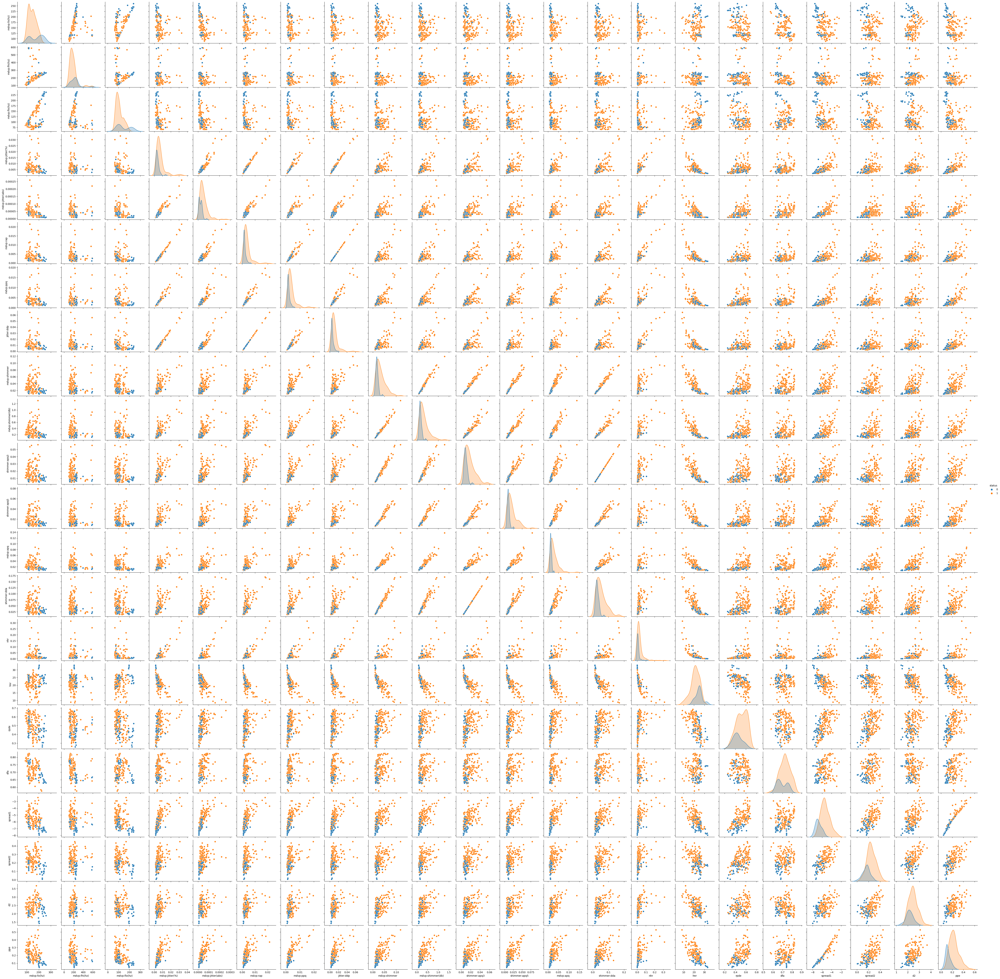

In [83]:


# Selecting the columns of interest
columns_of_interest = ['mdvp:fo(hz)', 'mdvp:fhi(hz)', 'mdvp:flo(hz)', 'mdvp:jitter(%)',
                       'mdvp:jitter(abs)', 'mdvp:rap', 'mdvp:ppq', 'jitter:ddp',
                       'mdvp:shimmer', 'mdvp:shimmer(db)', 'shimmer:apq3', 'shimmer:apq5',
                       'mdvp:apq', 'shimmer:dda', 'nhr', 'hnr', 'status', 'rpde', 'dfa',
                       'spread1', 'spread2', 'd2', 'ppe']

# Creating a subset DataFrame with the selected columns
subset_df = df[columns_of_interest]

# Pairwise scatter plot
sns.pairplot(subset_df, hue='status')
plt.show()

This plot shows the relationships between numerical variables by creating scatter plots for each pair of variables. The points are differentiated by the 'status' category using different colors.

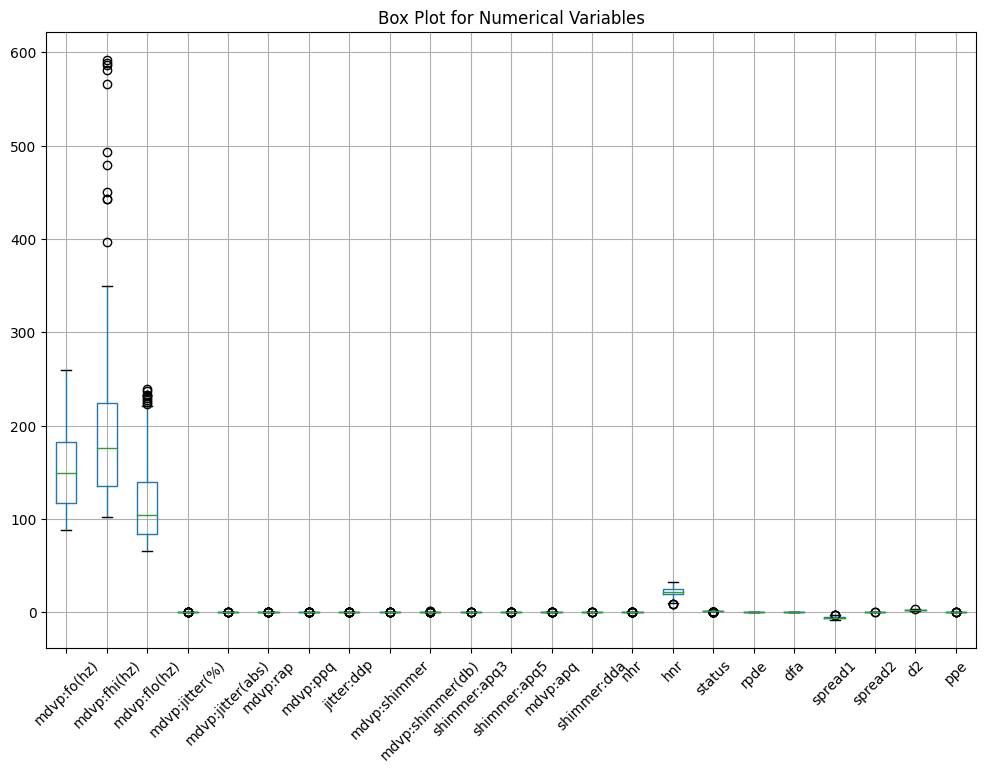

In [84]:
# Box plot for each numerical variable
plt.figure(figsize=(12, 8))
subset_df.boxplot(rot=45)
plt.title("Box Plot for Numerical Variables")
plt.show()

This plot displays the distribution of each numerical variable using a box and whisker representation. It helps identify potential outliers and visualize the spread and central tendency of the data.

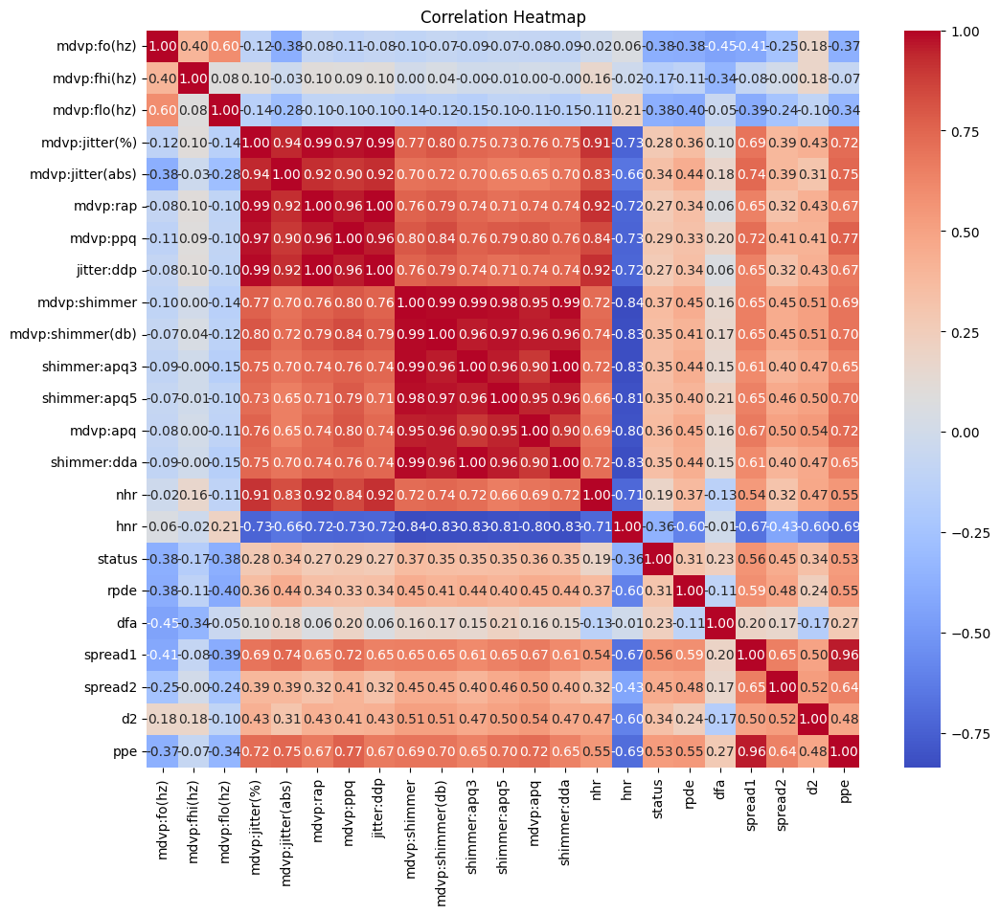

In [85]:
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(subset_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

This heatmap displays the correlation between each pair of numerical variables using color intensity. It provides insights into the strength and direction of the relationships between variables.

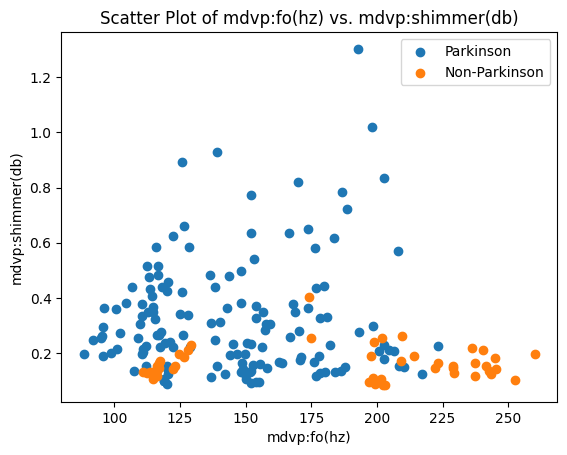

In [89]:
# Create a scatter plot
plt.scatter(df[df['status'] == 1]['mdvp:fo(hz)'], df[df['status'] == 1]['mdvp:shimmer(db)'], label='Parkinson')
plt.scatter(df[df['status'] == 0]['mdvp:fo(hz)'], df[df['status'] == 0]['mdvp:shimmer(db)'], label='Non-Parkinson')
plt.xlabel('mdvp:fo(hz)')
plt.ylabel('mdvp:shimmer(db)')
plt.title('Scatter Plot of mdvp:fo(hz) vs. mdvp:shimmer(db)')
plt.legend()
plt.show()


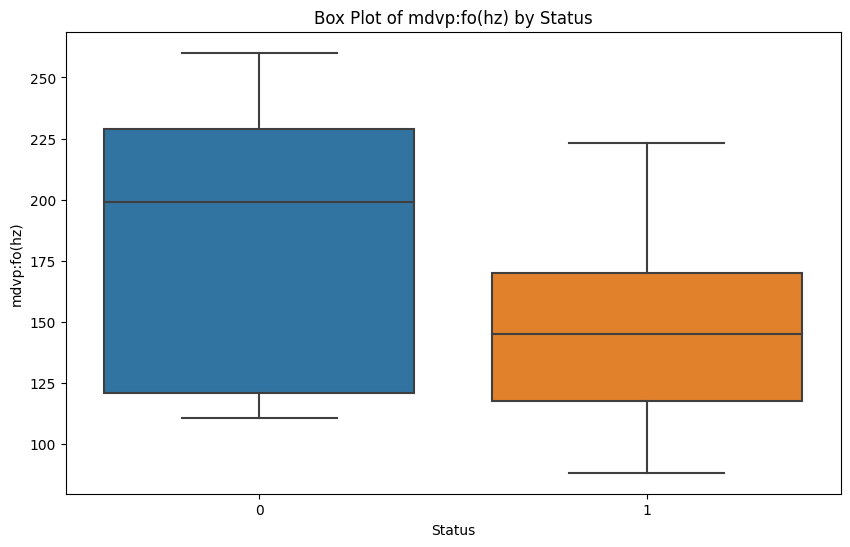

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(x='status', y='mdvp:fo(hz)', data=df)
plt.xlabel('Status')
plt.ylabel('mdvp:fo(hz)')
plt.title('Box Plot of mdvp:fo(hz) by Status')
plt.show()


box plot showing the distribution of 'mdvp:fo(hz)' for each status category (Parkinson's and non-Parkinson's)

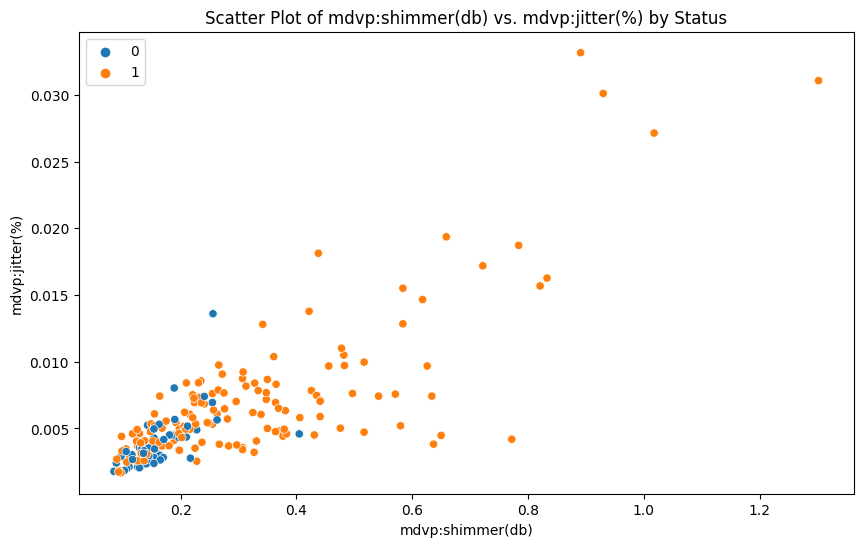

In [91]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='mdvp:shimmer(db)', y='mdvp:jitter(%)', hue='status', data=df)
plt.xlabel('mdvp:shimmer(db)')
plt.ylabel('mdvp:jitter(%)')
plt.title('Scatter Plot of mdvp:shimmer(db) vs. mdvp:jitter(%) by Status')
plt.legend()
plt.show()


scatter plot comparing 'mdvp:shimmer(db)' and 'mdvp:jitter(%)' for different status categories. Each point is colored based on the status (Parkinson's or non-Parkinson's).

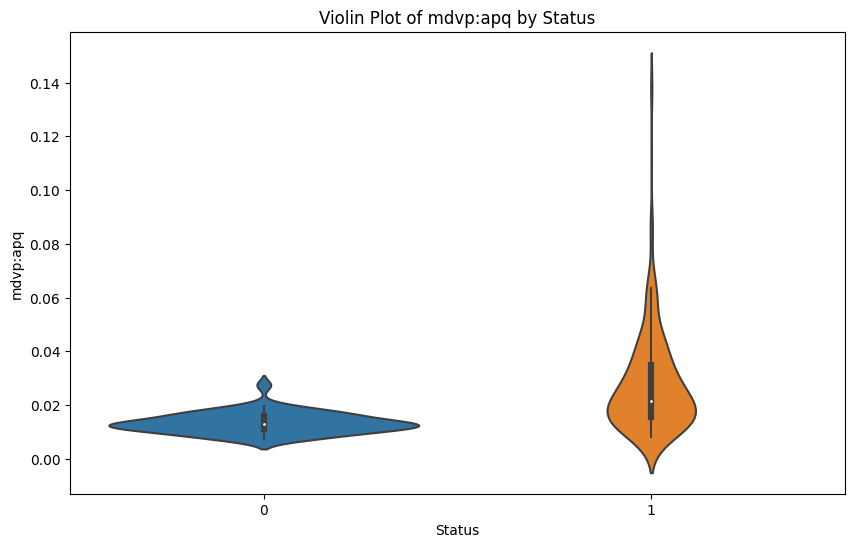

In [92]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='status', y='mdvp:apq', data=df)
plt.xlabel('Status')
plt.ylabel('mdvp:apq')
plt.title('Violin Plot of mdvp:apq by Status')
plt.show()


violin plot showing the distribution of 'mdvp:apq' for each status category.

These visualizations helps us understand the relationship between voice features and the status of Parkinson's disease. 

In [34]:
X = data.drop(['name', 'status'], axis=1)
y = data['status']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create a random forest classifier
rf = RandomForestClassifier()

# Create a GridSearchCV object
grid_search = GridSearchCV(rf, param_grid, cv=5)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found by grid search
print("Best Parameters: ", grid_search.best_params_)

# Evaluate the model with the best parameters on the test set
best_model = grid_search.best_estimator_
accuracy = best_model.score(X_test, y_test)
print("Accuracy: ", accuracy)


Best Parameters:  {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy:  0.9487179487179487
